In [57]:
import zipfile
from glob import glob
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import backend as K
from tensorflow.keras.models import Model, load_model, save_model
import warnings
warnings.filterwarnings('ignore')
import cv2
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from tensorflow.image import resize
import imageio
from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import os
import re
from keras_unet_collection import models, losses
from keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from keras.metrics import Accuracy
from skimage.metrics import structural_similarity as ssim
from tensorflow.keras.layers import Input, BatchNormalization, Dropout, Lambda,add, Conv2D, Conv2DTranspose, MaxPooling2D
from tensorflow.keras.layers import UpSampling2D, concatenate, BatchNormalization, Activation

In [331]:
data_path = "G:\\Harsh_Birva_minor_Proj\\FIVES\\train"


retina_files = glob(pathname = data_path+'\\Original\\*')
retina_files[:1]

mask_files = [path.replace('Original', 'Ground truth') for path in retina_files]
mask_files[:1]

data_path_test = "G:\\Harsh_Birva_minor_Proj\\FIVES\\test"

retina_files_test = glob(pathname = data_path_test+'\\Original\\*')
retina_files_test[:1]

mask_files_test = [path.replace('Original', 'Ground truth') for path in retina_files_test]
mask_files_test[:1]

df_train = pd.DataFrame( data = {
    'retina': retina_files,
    'mask': mask_files
})

df_test = pd.DataFrame( data = {
    'retina': retina_files_test,
    'mask': mask_files_test
})

for i,v in enumerate(df_train['retina']):
    if(v[-3:]!='png'):
        print(i)
        drop_row = i
        break

df_train.drop(drop_row, inplace=True)

600


In [2]:
def load_and_preprocess_image(file_path,resize):
    img = cv2.imread(file_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_resized = cv2.resize(img_rgb, (resize,resize))
    img_scaled = img_resized.astype(np.float32) / 255.0
    return img_scaled

In [3]:
def load_and_preprocess_mask(file_path,resize):
    img = cv2.imread(file_path, cv2.IMREAD_GRAYSCALE )
    img = img[:,:,np.newaxis]
    img_resized = cv2.resize(img, (resize,resize))
    img_scaled = img_resized.astype(np.float32) / 255.0
    img_scaled[img_scaled >= 0.25] = 1
    img_scaled[img_scaled < 0.25] = 0
    return img_scaled

In [4]:
def dice_coeff(y_true, y_pred, smooth=100):
    y_true_flatten = K.flatten(y_true)
    y_pred_flatten = K.flatten(y_pred)

    intersection = K.sum(y_true_flatten * y_pred_flatten)
    union = K.sum(y_true_flatten) + K.sum(y_pred_flatten)
    return (2 * intersection + smooth) / (union + smooth)

def dice_coeff_loss(y_true, y_pred, smooth=100):
    return 1 - dice_coeff(y_true, y_pred, smooth)

In [5]:
def DICE_COE(mask1, mask2):
    intersect = np.sum(mask1*mask2)
    fsum = np.sum(mask1)
    ssum = np.sum(mask2)
    dice = (2 * intersect ) / (fsum + ssum)
    dice = np.mean(dice)
    dice = round(dice, 3)
    return dice    

In [6]:
path = 'G:\\Harsh_Birva_minor_Proj\\new_retina_models_5\\restype_16-1.keras'
model = tf.keras.models.load_model(path, custom_objects={'dice_coeff': dice_coeff ,'dice_coeff_loss': dice_coeff_loss})

In [455]:
# retina_img = load_and_preprocess_image(df_test.iloc[65]['retina'],512)
# mask_img = load_and_preprocess_mask(df_test.iloc[65]['mask'],512)
retina_img = load_and_preprocess_image(f"G:\\Harsh_Birva_minor_Proj\\FIVES\\test\\Original\\175_N.png",512)
mask_img = load_and_preprocess_mask(f"G:\\Harsh_Birva_minor_Proj\\FIVES\\test\\Ground truth\\175_N.png",512)

retina_img = retina_img[np.newaxis,:,:,:]
pred_img = model.predict(retina_img)
pred_img = (np.squeeze(pred_img) > 0.5).astype(np.uint8)
mask_img = np.squeeze(mask_img).astype(np.uint8)

1/1 [==============================] - 0s 203ms/step


In [456]:
df_test.iloc[65]['retina']

'G:\\Harsh_Birva_minor_Proj\\FIVES\\test\\Original\\15_A.png'

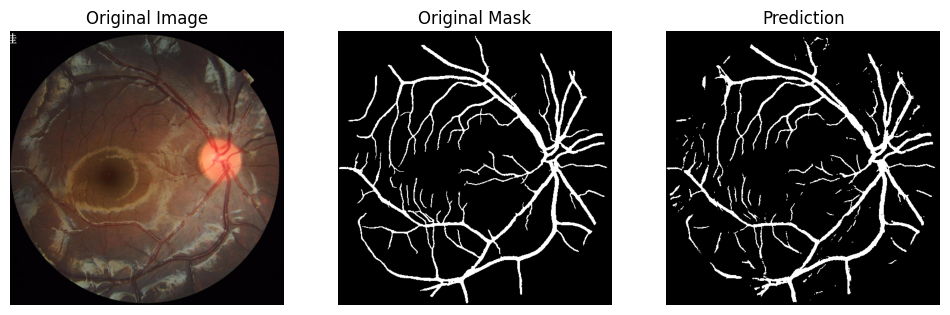

In [457]:
for i in range(1):
    plt.figure(figsize=(12,12))
    
    plt.subplot(1, 3, 1)
    plt.imshow(np.squeeze(retina_img))
    plt.axis('off')
    plt.title("Original Image")
    
    plt.subplot(1, 3, 2)
    plt.imshow(mask_img,cmap='gray')
    plt.axis('off')
    plt.title("Original Mask")
    
    plt.subplot(1, 3, 3)
    plt.imshow(pred_img,cmap='gray')
    plt.title("Prediction")
    plt.axis('off')
    
plt.show()

In [339]:
retina_img = np.squeeze(retina_img)*255.0

In [200]:
retina_img = cv2.cvtColor(retina_img, cv2.COLOR_RGB2HSV)

In [201]:
colors = retina_img[pred_img == 1]

In [202]:
colors.shape

(20268, 3)

In [203]:
target = colors - np.median(colors,axis=0)

In [204]:
error = np.mean(target,axis=0)

In [205]:
dist = np.linalg.norm(retina_img - target,axis=2)

ValueError: operands could not be broadcast together with shapes (512,512,3) (20268,3) 

In [220]:
min_color = np.percentile(colors,10, axis=0)
max_color = np.percentile(colors,85, axis=0)

In [221]:
min_color

array([16.03448296,  0.81818181, 86.        ])

In [222]:
max_color

array([ 21.89189148,   0.90697676, 160.        ])

In [223]:
thresholded_image = cv2.inRange(retina_img, min_color,max_color)

In [224]:
np.median(colors,axis=0)

array([ 19.52094  ,   0.8702997, 119.       ], dtype=float32)

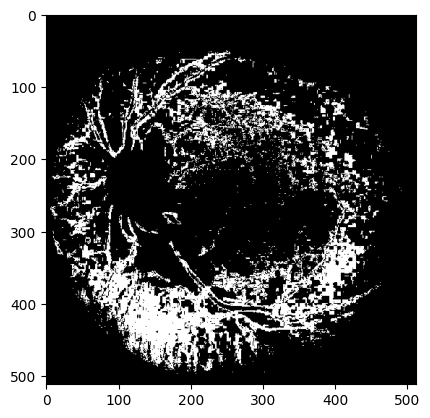

In [225]:
plt.imshow(thresholded_image,cmap='gray')

In [403]:
gray_img = cv2.cvtColor(retina_img, cv2.COLOR_RGB2GRAY).astype(np.uint8)

blurred = cv2.GaussianBlur(gray_img, (5, 5), 0)


In [404]:
np.unique(blurred)

array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
        13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
        26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
        39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
        52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
        65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
        78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
        91,  92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103,
       104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116,
       117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129,
       130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142,
       143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155,
       156, 157, 158, 159, 160, 161, 162, 164, 165, 166, 167, 169, 170,
       172, 173, 174, 175, 176, 177, 183, 184], dtype=uint8)

In [413]:
edges = cv2.Canny(blurred , threshold1=20, threshold2=50,apertureSize=3)

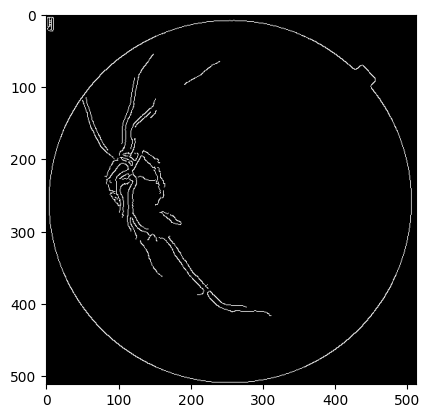

In [414]:
plt.imshow(edges, cmap='gray')

# RETA Data

In [15]:
data_path_test = "G:\\Harsh_Birva_minor_Proj\\RETA\\images\\images\\train"

mask_files_t = []
mask_files_test = []

retina_files_test = glob(pathname = data_path_test+'\\img\\*')
retina_files_test[:1]

for path in retina_files_test:
    directory = os.path.dirname(path)
    filename, file_extension = os.path.splitext(os.path.basename(path))
    new_path = os.path.join(directory, filename + "_vessel" + file_extension)
    mask_files_t.append(new_path)
    
for path in mask_files_t:    
    directory, filename = os.path.split(path)
    new_directory = directory.replace('img', 'vessel')
    new_path = os.path.join(new_directory, filename)
    mask_files_test.append(new_path)

mask_files_test = [path.replace('jpg', 'png') for path in mask_files_test]
mask_files_test[:1]

df_test = pd.DataFrame( data = {
    'retina': retina_files_test,
    'mask': mask_files_test
})

In [16]:
mask_files_test[3]

'G:\\Harsh_Birva_minor_Proj\\RETA\\images\\images\\train\\vessel\\IDRiD_04_vessel.png'

In [17]:
df_test

,retina,mask
0,G:\Harsh_Birva_minor_Proj\RETA\images\images\t...,G:\Harsh_Birva_minor_Proj\RETA\images\images\t...
1,G:\Harsh_Birva_minor_Proj\RETA\images\images\t...,G:\Harsh_Birva_minor_Proj\RETA\images\images\t...
2,G:\Harsh_Birva_minor_Proj\RETA\images\images\t...,G:\Harsh_Birva_minor_Proj\RETA\images\images\t...
3,G:\Harsh_Birva_minor_Proj\RETA\images\images\t...,G:\Harsh_Birva_minor_Proj\RETA\images\images\t...
4,G:\Harsh_Birva_minor_Proj\RETA\images\images\t...,G:\Harsh_Birva_minor_Proj\RETA\images\images\t...
5,G:\Harsh_Birva_minor_Proj\RETA\images\images\t...,G:\Harsh_Birva_minor_Proj\RETA\images\images\t...
6,G:\Harsh_Birva_minor_Proj\RETA\images\images\t...,G:\Harsh_Birva_minor_Proj\RETA\images\images\t...
7,G:\Harsh_Birva_minor_Proj\RETA\images\images\t...,G:\Harsh_Birva_minor_Proj\RETA\images\images\t...
8,G:\Harsh_Birva_minor_Proj\RETA\images\images\t...,G:\Harsh_Birva_minor_Proj\RETA\images\images\t...
9,G:\Harsh_Birva_minor_Proj\RETA\images\images\t...,G:\Harsh_Birva_minor_Proj\RETA\images\images\t...


In [29]:
path = 'G:\\Harsh_Birva_minor_Proj\\new_retina_models_5\\mynet_32-1.keras'
model = tf.keras.models.load_model(path, custom_objects={'dice_coeff': dice_coeff ,'dice_coeff_loss': dice_coeff_loss})

1/1 [==============================] - 0s 16ms/step


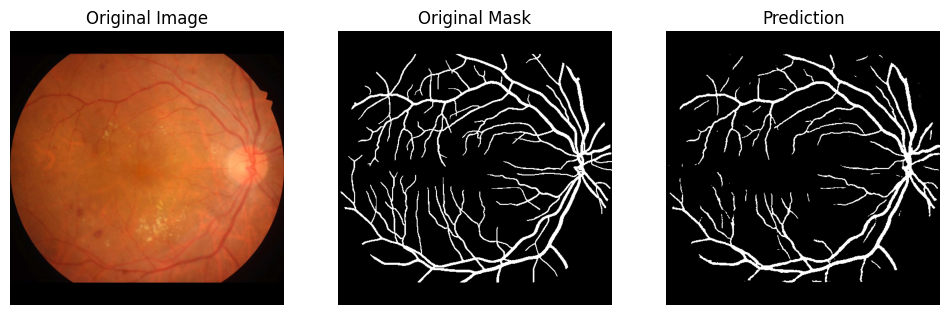

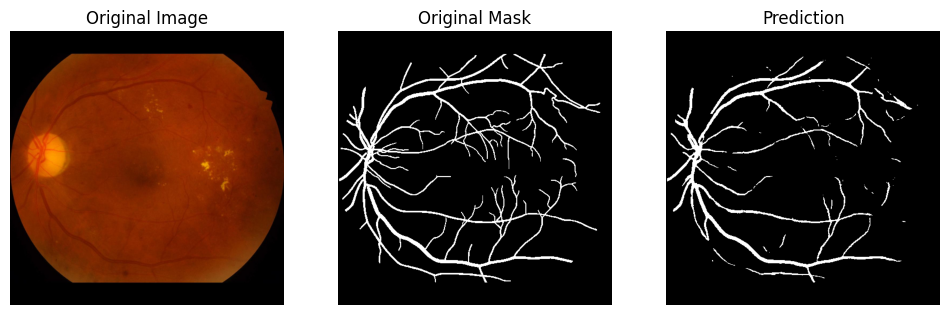

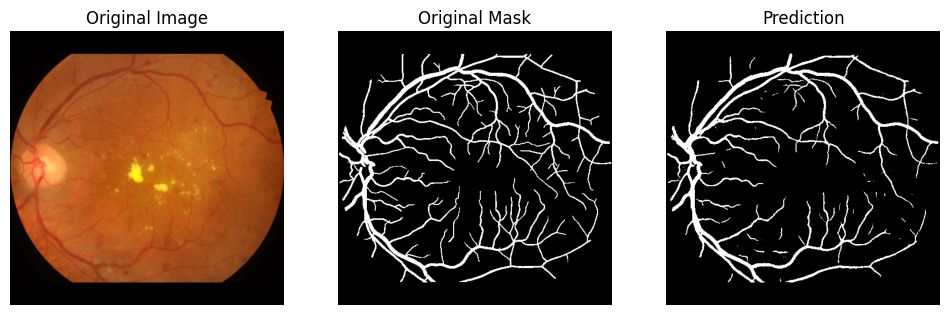

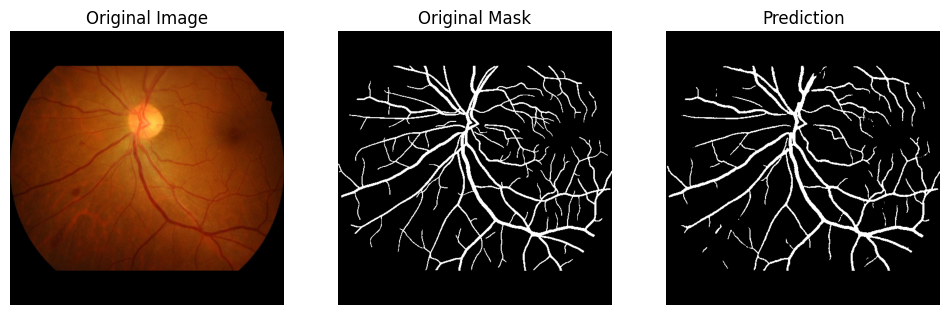

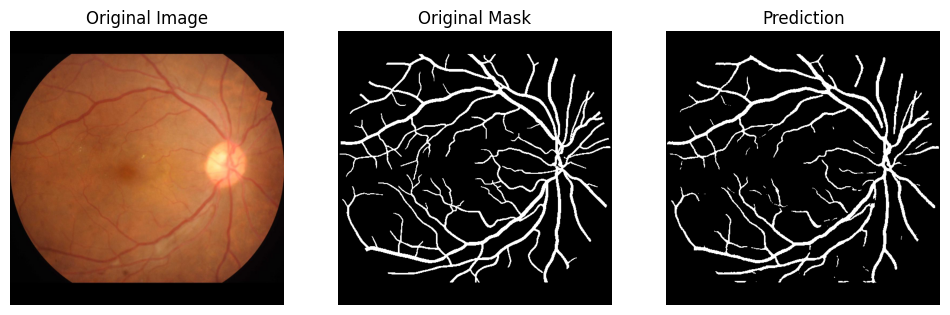

...

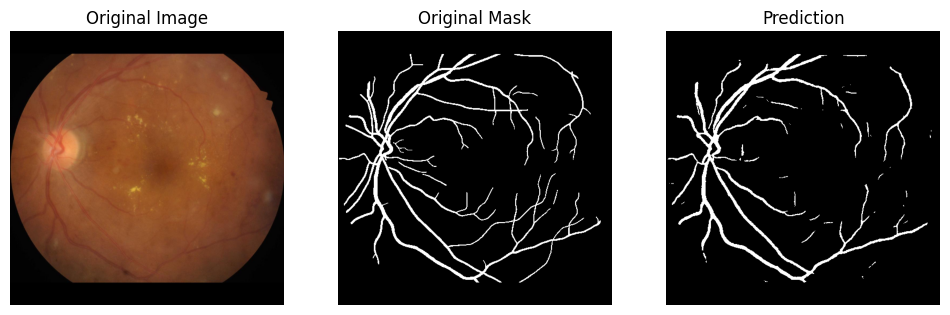

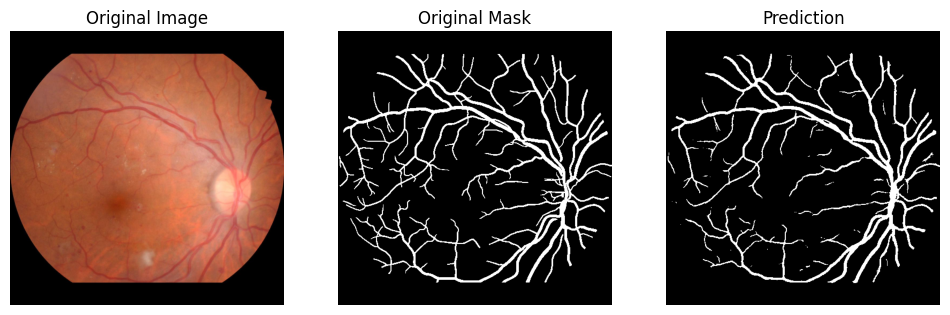

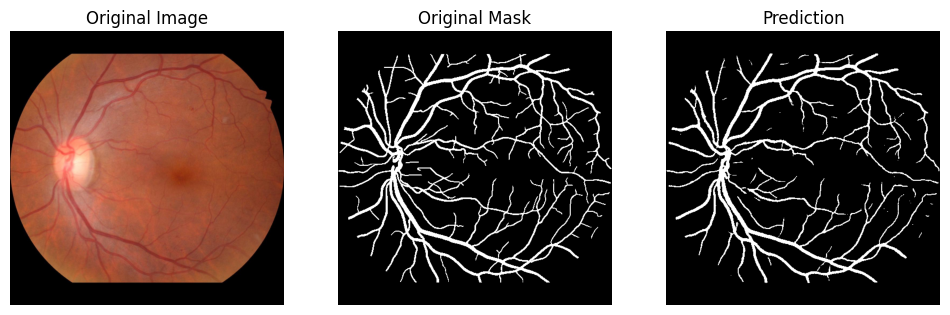

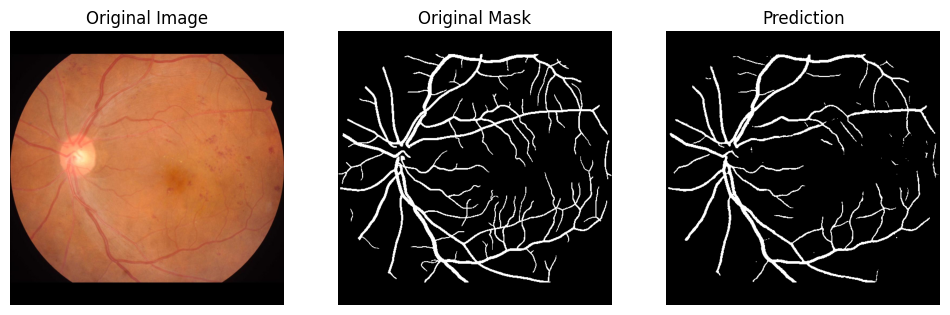

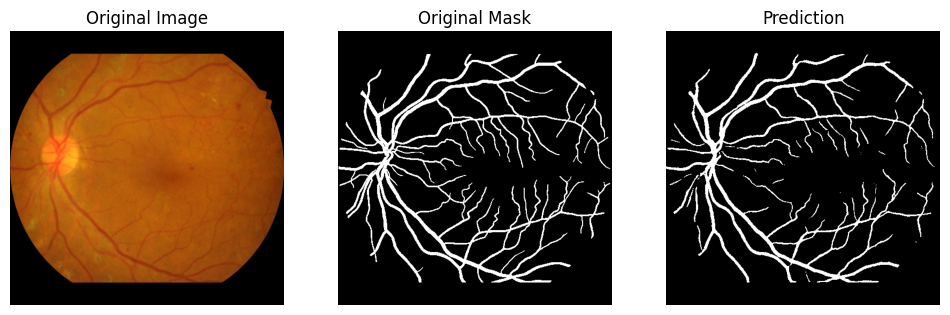

In [30]:
full = []
for i in range(len(df_test)):
    retina_img = load_and_preprocess_image(df_test.iloc[i]['retina'],512)
    mask_img = load_and_preprocess_mask(df_test.iloc[i]['mask'],512)

    retina_img = retina_img[np.newaxis,:,:,:]
    pred_img = model.predict(retina_img)
    pred_img = (np.squeeze(pred_img) > 0.5).astype(np.uint8)
    mask_img = np.squeeze(mask_img).astype(np.uint8)

    full.append(DICE_COE(mask_img,pred_img))

    plt.figure(figsize=(12,12))

    plt.subplot(1, 3, 1)
    plt.imshow(np.squeeze(retina_img))
    plt.axis('off')
    plt.title("Original Image")

    plt.subplot(1, 3, 2)
    plt.imshow(mask_img,cmap='gray')
    plt.axis('off')
    plt.title("Original Mask")

    plt.subplot(1, 3, 3)
    plt.imshow(pred_img,cmap='gray')
    plt.title("Prediction")
    plt.axis('off')

plt.show()

In [31]:
np.mean(full)

0.8070555555555556

# IEEE Data

In [71]:
data_path_test = "G:\\Harsh_Birva_minor_Proj\\datasets\\training\\training"

mask_files_t = []
mask_files_test = []

retina_files_test = glob(pathname = data_path_test+'\\images\\*')
retina_files_test[:1]

mask_files_t = [path.replace('images', '1st_manual') for path in retina_files_test]
mask_files_t[:1]

for path in mask_files_t:
    new_path = os.path.join(os.path.dirname(path), os.path.basename(path).split('_')[0]+'_manual1.gif')
    mask_files_test.append(new_path)
    
df_test = pd.DataFrame( data = {
    'retina': retina_files_test,
    'mask': mask_files_test
})

In [72]:
def load_and_preprocess_image(file_path,resize):
    img = cv2.imread(file_path)
    img = img[9:-10,:,:]
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_resized = cv2.resize(img_rgb, (resize,resize))
    img_scaled = img_resized.astype(np.float32) / 255.0
    return img_scaled

In [73]:
def load_and_preprocess_mask(file_path,resize):
    img = imageio.imread(file_path)
    img = img[:,:,np.newaxis]
    img = img[9:-10,:,:]
    img_resized = cv2.resize(img, (resize,resize))
    img_scaled = img_resized.astype(np.float32) / 255.0
    img_scaled[img_scaled >= 0.25] = 1
    img_scaled[img_scaled < 0.25] = 0
    return img_scaled

In [80]:
path = 'G:\\Harsh_Birva_minor_Proj\\new_retina_models_5\\simplenet_32-1.keras'
model = tf.keras.models.load_model(path, custom_objects={'dice_coeff': dice_coeff ,'dice_coeff_loss': dice_coeff_loss})

1/1 [==============================] - 0s 31ms/step


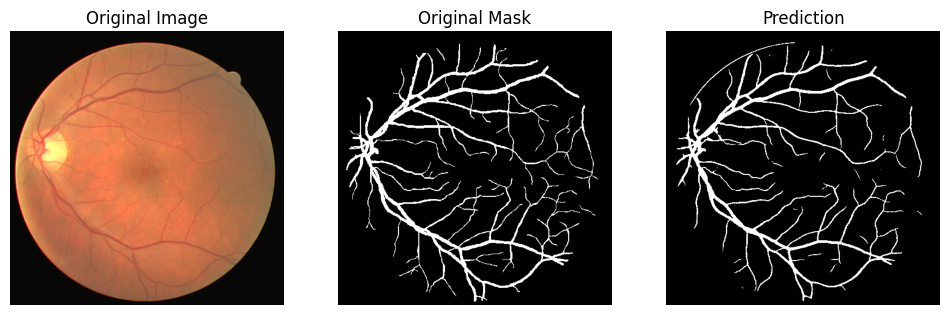

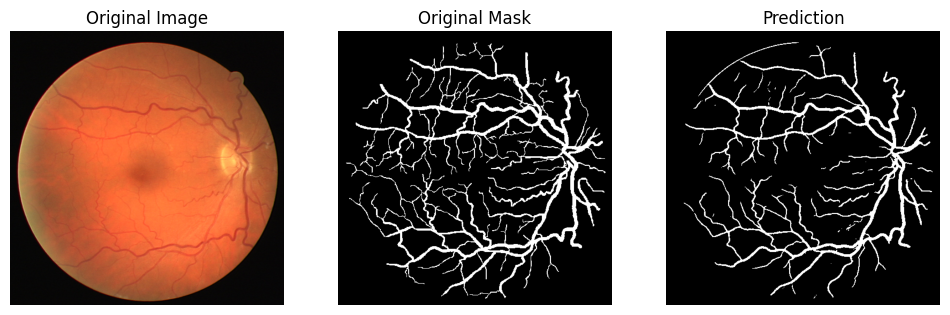

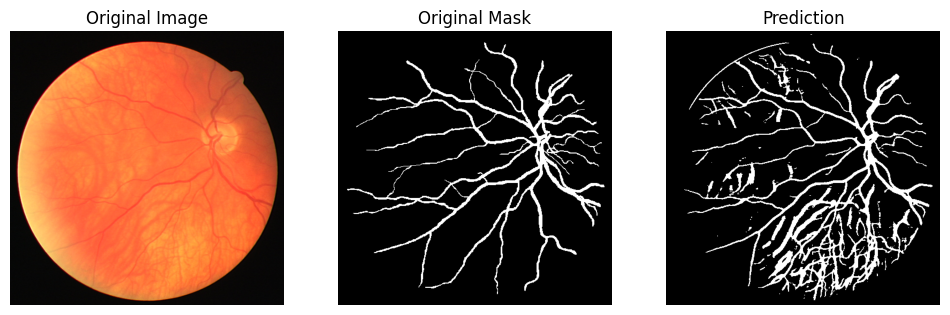

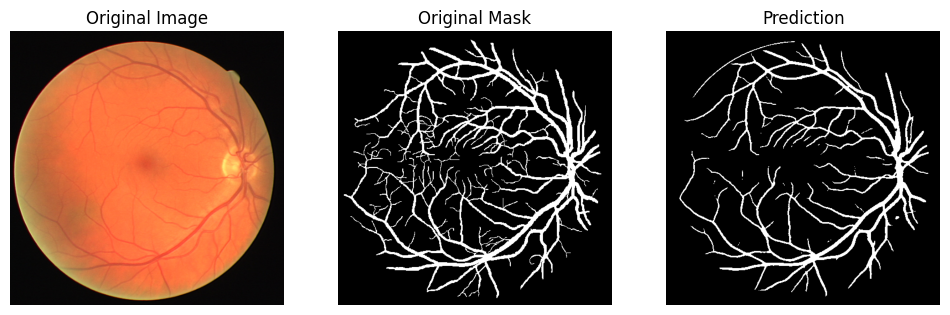

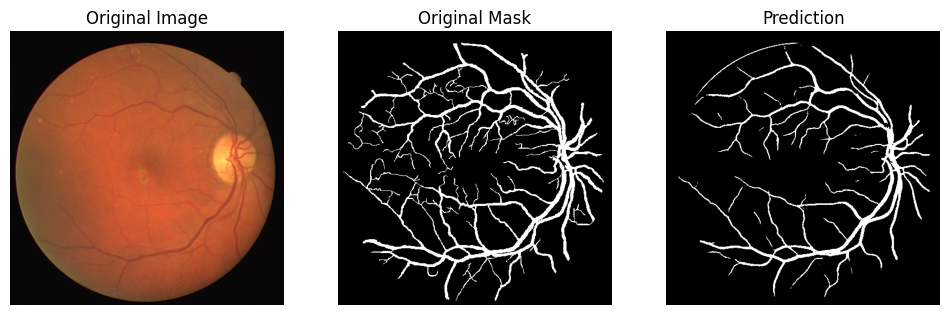

...

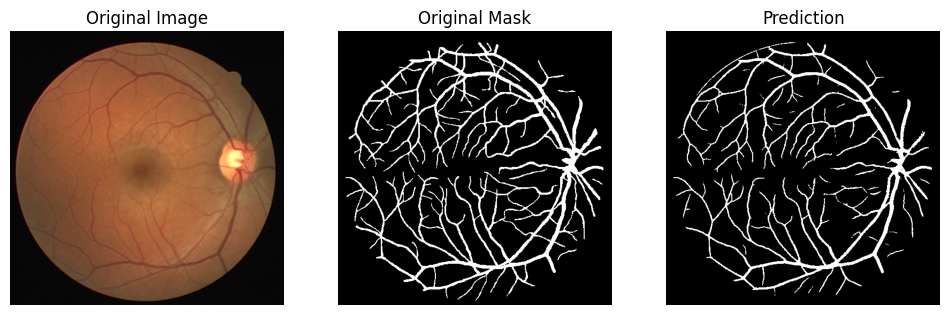

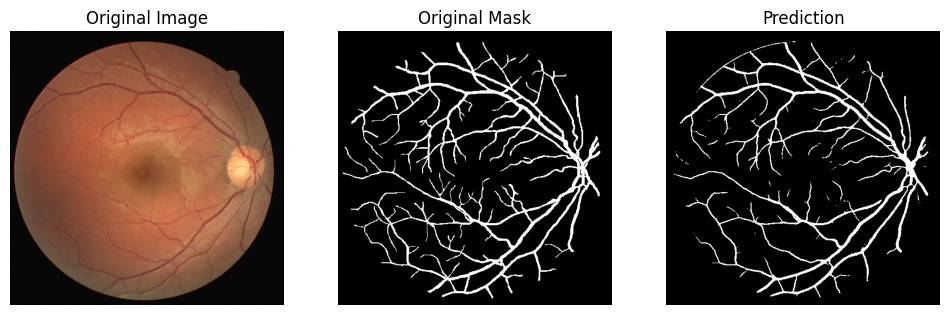

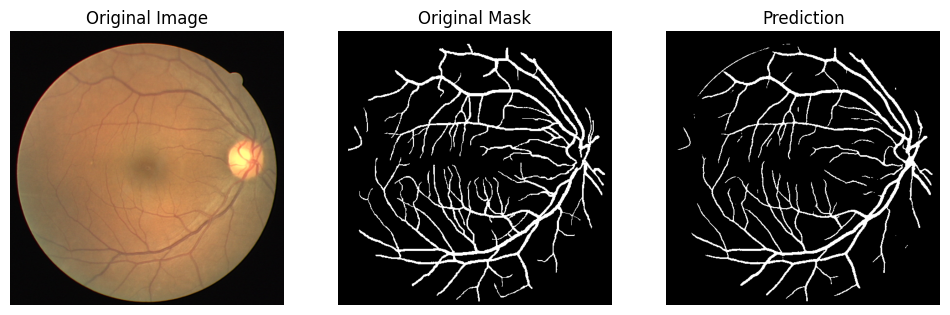

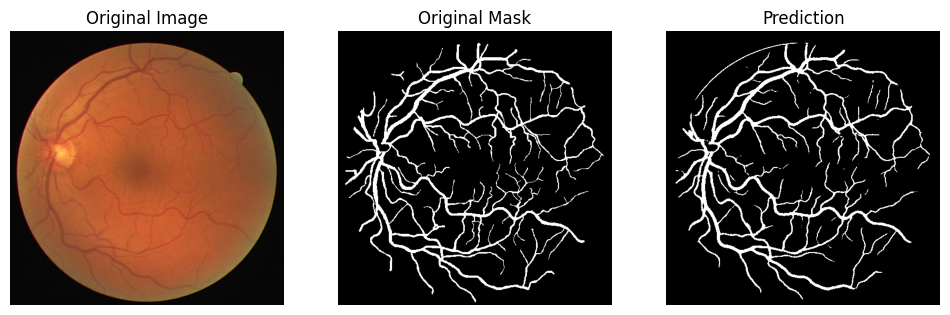

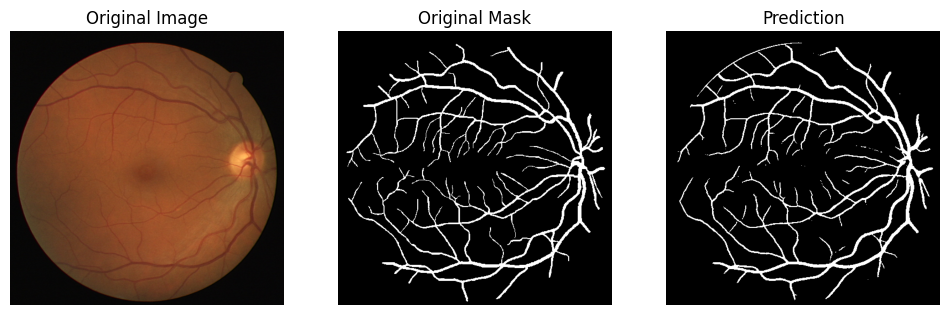

In [81]:
full = []
for i in range(len(df_test)):
    retina_img = load_and_preprocess_image(df_test.iloc[i]['retina'],512)
    mask_img = load_and_preprocess_mask(df_test.iloc[i]['mask'],512)

    retina_img = retina_img[np.newaxis,:,:,:]
    pred_img = model.predict(retina_img)
    pred_img = (np.squeeze(pred_img) > 0.5).astype(np.uint8)
    mask_img = np.squeeze(mask_img).astype(np.uint8)

    full.append(DICE_COE(mask_img,pred_img))

    plt.figure(figsize=(12,12))

    plt.subplot(1, 3, 1)
    plt.imshow(np.squeeze(retina_img))
    plt.axis('off')
    plt.title("Original Image")

    plt.subplot(1, 3, 2)
    plt.imshow(mask_img,cmap='gray')
    plt.axis('off')
    plt.title("Original Mask")

    plt.subplot(1, 3, 3)
    plt.imshow(pred_img,cmap='gray')
    plt.title("Prediction")
    plt.axis('off')

plt.show()

In [82]:
np.mean(full)

0.7735000000000001